In [ ]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16625, done.
remote: Counting objects: 100% (103/103), done.
remote: Compressing objects: 100% (74/74), done.
remote: Total 16625 (delta 58), reused 62 (delta 29), pack-reused 16522
Receiving objects: 100% (16625/16625), 15.10 MiB | 25.59 MiB/s, done.
Resolving deltas: 100% (11417/11417), done.
/content/yolov5


In [ ]:
!pip install -qr requirements.txt
import torch
from IPython.display import Image, clear_output


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.9/63.9 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 760.3/760.3 kB 20.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 43.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests==2.31.0, but you have requests 2.32.2 which is incompatible.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.3.0 which is incompatible.


In [ ]:
%cd /content

/content


In [ ]:
%cd /content
!curl -L "https://github.com/AnshDarji12/Object-Detaction/blob/main/Sign%20language%20project.v1i.yolov5pytorch.zip"> Sign%20language%20proje.zip ; unzip -v /content/Sign%20language%20proje.zip



/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  145k    0  145k    0     0   197k      0 --:--:-- --:--:-- --:--:--  197k
Archive:  /content/Sign%20language%20proje.zip
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of /content/Sign%20language%20proje.zip or
        /content/Sign%20language%20proje.zip.zip, and cannot find /content/Sign%20language%20proje.zip.ZIP, period.


In [ ]:
import zipfile

file_path = '/content/Sign%20language%20proje.zip'

# Check if the file is a zip file
is_zipfile = zipfile.is_zipfile(file_path)

print(f"Is the file a zip file? {is_zipfile}")

# Try to open the zip file
if is_zipfile:
    with zipfile.ZipFile(file_path, 'r') as zip_ref:
        zip_ref.extractall('/content/extracted_files')
        print("Files extracted successfully.")
else:
    print("The file is not a valid zip file or is corrupted.")


Is the file a zip file? False
The file is not a valid zip file or is corrupted.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
%cat /content/data.yaml

train: ../train/images
val: ../val/images
test: ../test/images

nc: 9
names: ['buds', 'fuch you', 'hii', 'i love you', 'man', 'no.', 'please', 'thank you', 'yes.']



In [ ]:
num_classes

'9'

In [ ]:
from IPython.core.magic import register_line_cell_magic
@register_line_cell_magic
def write(line,cell):
  with open(line,'w') as f:
    f.write(cell.format(**globals()))

In [ ]:
import yaml
with open("/content/data.yaml","r") as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license
%%write /content/yolov5/models/custom_yolov5s.yaml
# Parameters
nc: {num_classes} # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4], 1, Concat, [1]], # cat backbone P3
    [-1, 3, C3, [256, False]], # 17 (P3/8-small)

    [-1, 1, Conv, [256, 3, 2]],
    [[-1, 14], 1, Concat, [1]], # cat head P4
    [-1, 3, C3, [512, False]], # 20 (P4/16-medium)

    [-1, 1, Conv, [512, 3, 2]],
    [[-1, 10], 1, Concat, [1]], # cat head P5
    [-1, 3, C3, [1024, False]], # 23 (P5/32-large)

    [[17, 20, 23], 1, Detect, [nc, anchors]], # Detect(P3, P4, P5)
  ]


In [ ]:
%cd /content/yolov5
!python train.py --img 640 --batch 16 --epochs 100 --data '../data.yaml' --cfg /content/yolov5/models/custom_yolov5s.yaml --weights 'yolov5s.pt' --name yolov5s_results --cache

/content/yolov5
2024-05-24 15:54:04.651623: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-24 15:54:04.651733: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-24 15:54:04.825395: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=/content/yolov5/models/custom_yolov5s.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weigh

In [ ]:
%load_ext tensorboard
%tensorboard --logdir  runs

<IPython.core.display.Javascript object>

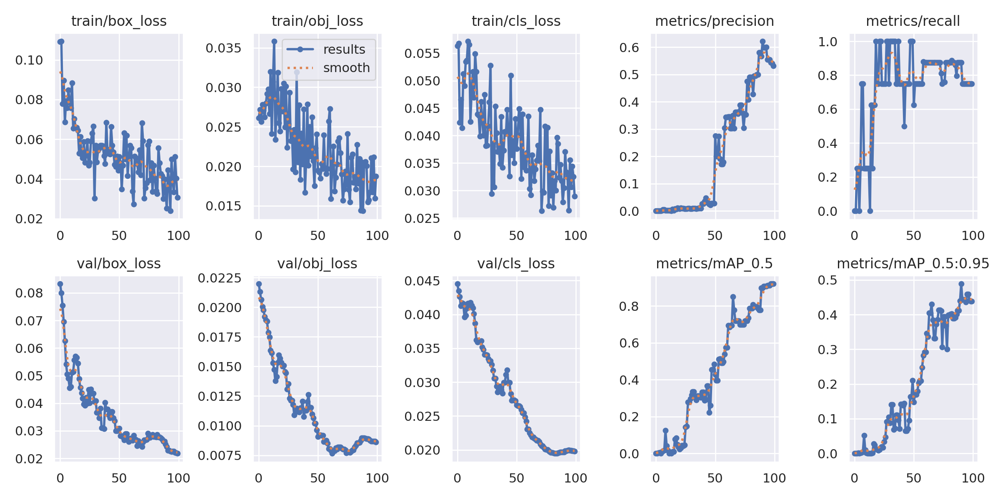

In [ ]:
from utils.plots import plot_results
Image(filename='/content/yolov5/runs/train/yolov5s_results2/results.png',width=1000)

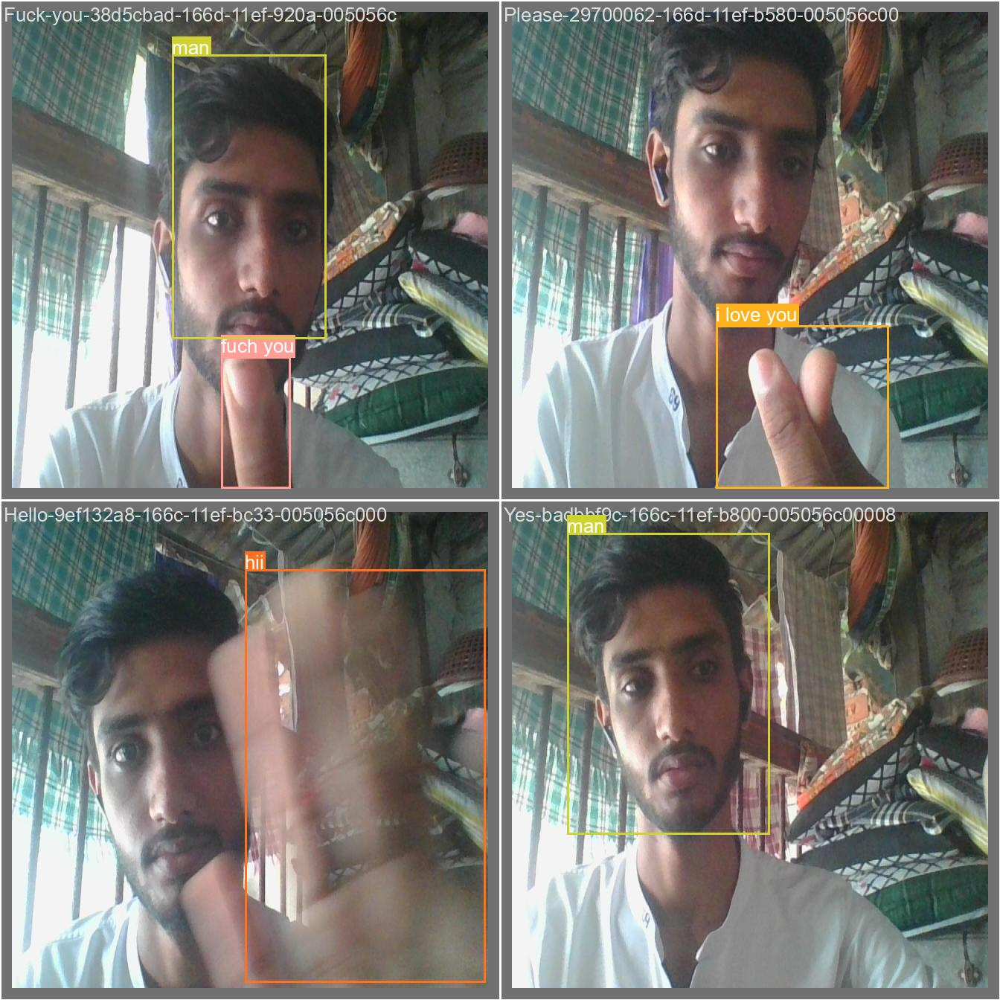

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results2/val_batch0_labels.jpg',width=1000)

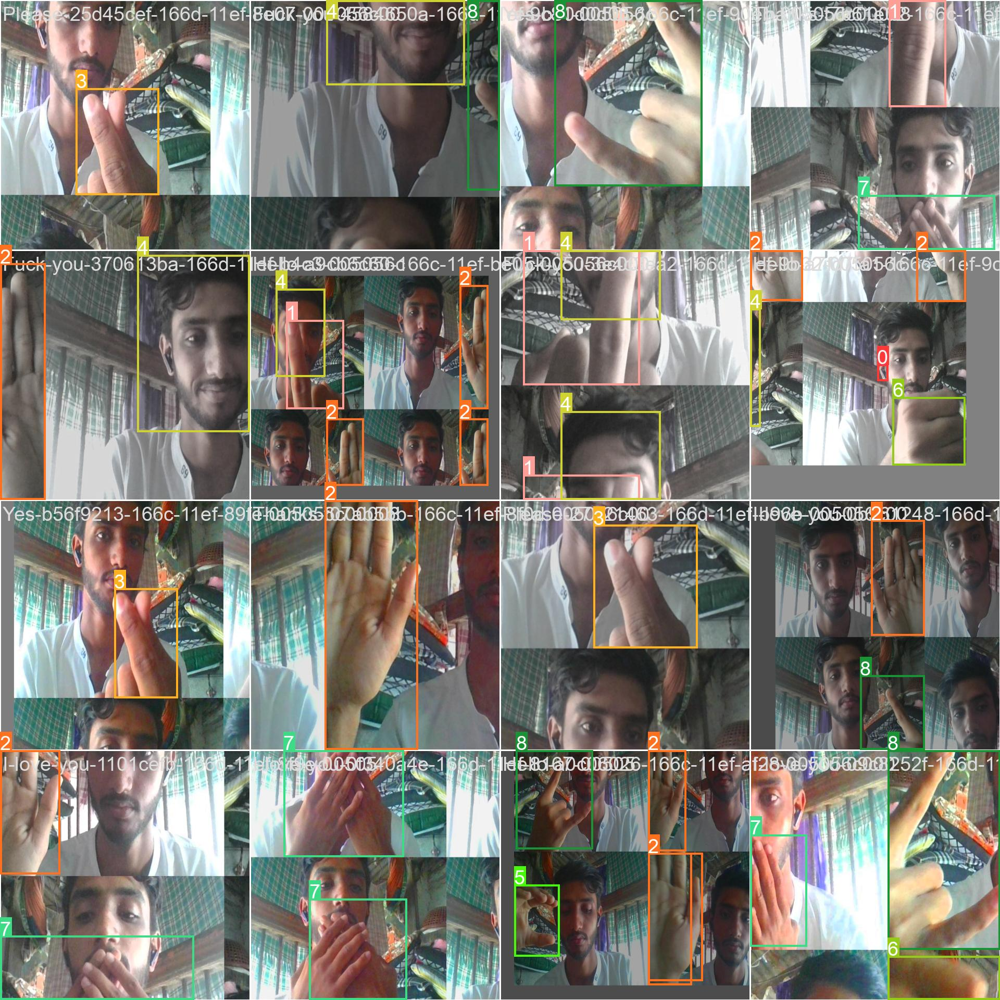

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results2/train_batch0.jpg',width=900)

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results2/weights/best.pt --img 416 --conf 0.5 --source /content/test/images

detect: weights=['/content/yolov5/runs/train/yolov5s_results2/weights/best.pt'], source=/content/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-314-g60dde7f1 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7034398 parameters, 0 gradients, 15.8 GFLOPs
image 1/5 /content/test/images/Fuck-you-3aac5977-166d-11ef-b3ee-005056c00008_jpg.rf.59a3d770fe52beee3a51f5446d26d556.jpg: 416x416 (no detections), 7.1ms
image 2/5 /content/test/images/Fuck-you-401a44d6-166d-11ef-8d29-005056c00008_jpg.rf.3780f275611e7431677b90a9921504ec.jpg: 416x416 (no dete